# Facial recognition example using SVMs

## Library imports

In [17]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import svm


# PIL is used to load the image
from PIL import Image

# Function & Variable Definitions

## Variables

Define variables that will be reused in this block

In [24]:
trainClassification = ["Satch", "Montaniel", "Ordave"]

trainFilesPath = "resources/DATASET/Train"
testFilesPath = "resources/DATASET/Test"
newTestFilesPath = "resources/DATASET/New"

## Functions
Define functions that will be reused in this block

In [27]:
def displayImage(image_path: str):
	"""
	Displays the image in the given path using matplotlib.

	:param image_path: Path to the image file to display.
	"""
	# Path to your image file in Google Drive
	image = Image.open(image_path)

	# Display the image using matplotlib
	plt.imshow(image)
	
	# Hide axes for cleaner display
	plt.axis('on')
	
	plt.show()

def loadImagesFromFolder(folder):
	"""
	Loads images from the given folder path and returns them as a list.

	:param folder: Path to the folder containing the images.
	"""
	images = []
	labels = []
	for label, person in enumerate(os.listdir(folder)):
		person_folder = os.path.join(folder, person)
		person_name = os.path.basename(person_folder)
		for filename in os.listdir(person_folder):
			img_path = os.path.join(person_folder, filename)
			img = cv2.imread(img_path)
			img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
			img = cv2.resize(img, (100, 100))  # Resize to 100x100 pixels
			images.append(img.flatten())  # Flatten the image
			labels.append(person_name)
	return np.array(images), np.array(labels)

def predictImg(imgPath, model):
    # Add inline documentation later

	img = cv2.imread(imgPath)
	img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
	img = cv2.resize(img, (100, 100)).flatten().reshape(1, -1)  # Flatten and reshape for prediction
	prediction = model.predict(img)

	return prediction

# Fetch Train Files

In [4]:
trainFiles = {}

for identifier in trainClassification:
	trainFiles[identifier] = []

	for root, dirs, files in os.walk(os.path.join(trainFilesPath, identifier)):
		for file in files:
			if file.endswith(".jpg"):
				trainFiles[identifier].append(os.path.join(root, file))

In [5]:
trainFiles

{'Satch': ['resources/DATASET/Train\\Satch\\SatchTrain0.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain1.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain10.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain11.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain12.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain13.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain14.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain15.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain16.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain17.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain18.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain19.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain2.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain20.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain21.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain22.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain23.jpg',
  'resources/DATASET/Train\\Satch\\SatchTrain24.jpg',
  'resources/DATASET/T

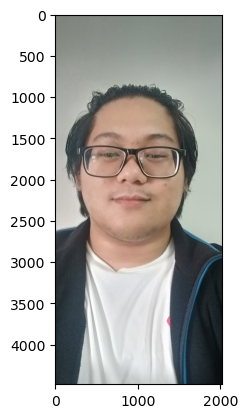

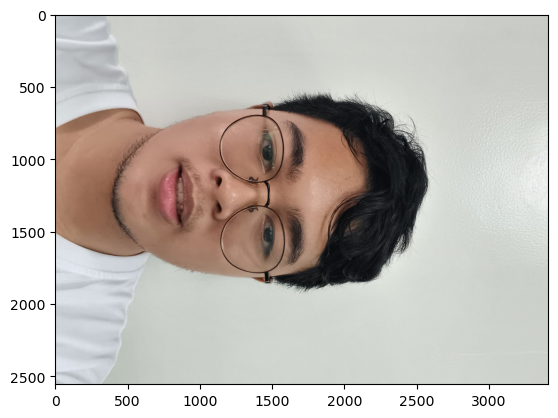

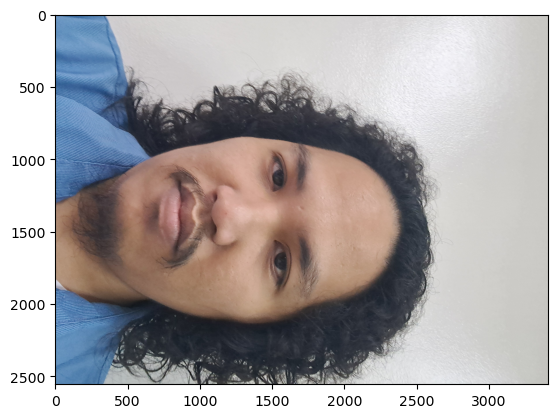

In [6]:
for identifier in trainClassification:
	displayImage(trainFiles[identifier][0])

# Convert to GrayScale

In [7]:
images, labels = loadImagesFromFolder(trainFilesPath)

In [8]:
images.shape

(150, 10000)

In [9]:
labels.shape

(150,)

In [10]:
labels

array(['Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel', 'Montaniel',
       'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave',
       'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave',
       'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave',
       'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave', 'Ordave',
       'Orda

## Display One Image
Display a single image from training set

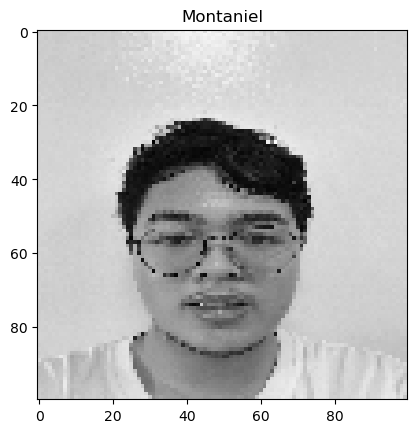

In [11]:
image = images[0].reshape(100, 100)
name = labels[0]

plt.imshow(image, cmap="gray")
plt.title(name)
plt.axis('on')  # Hide axes
plt.show()

# Display Several Images
Display a single image from training set

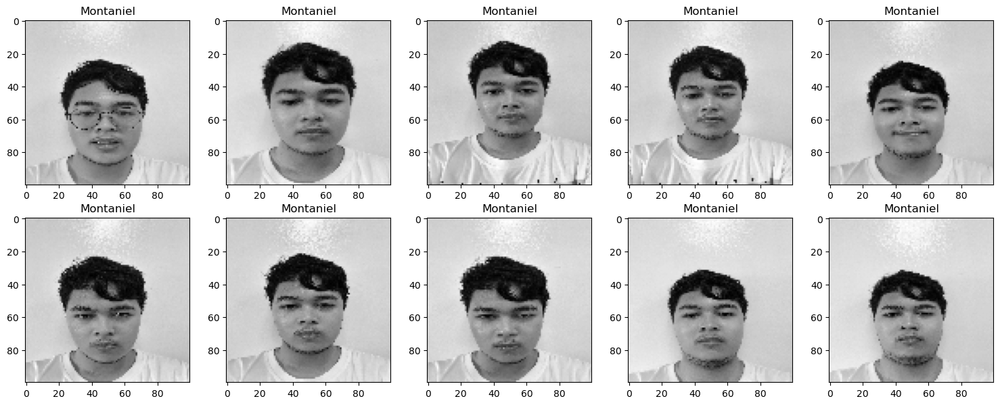

In [12]:
numFace = 10

fig, axes = plt.subplots(2, 5, figsize = (15, 6))
axes = axes.flatten()

for i in range(numFace):
	image = images[i].reshape(100, 100)
	name = labels[i]

	axes[i].imshow(image, cmap="gray")
	axes[i].set_title(name)
	axes[i].axis('on')  # Hide axes

plt.tight_layout()
plt.show()

# Split Data

Splits the dataset into train and test

In [14]:
xTrain, xTest, yTrain, yTest = train_test_split(images, labels, test_size=0.2, random_state=42)

# Train SVM Model

In [19]:
# You can choose different kernels like 'linear', 'rbf', etc.
model = svm.SVC(gamma='scale', kernel="linear")
model.fit(xTrain, yTrain)

SVC(kernel='linear')

In [22]:
yPred = model.predict(xTest)
accuracy = accuracy_score(yTest, yPred)
print(f'Accuracy: {accuracy * 100:.2f}%')

Accuracy: 100.00%


# Testing

Prediction: ['Montaniel']


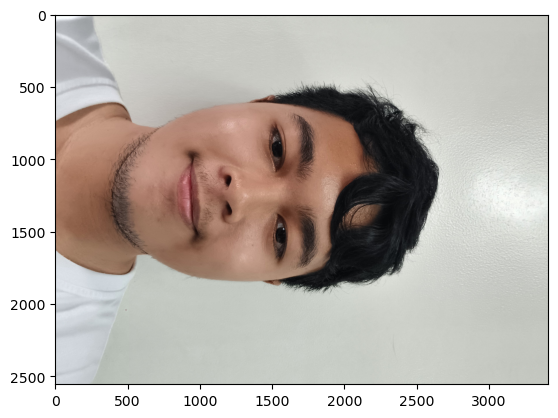

Prediction: ['Montaniel']


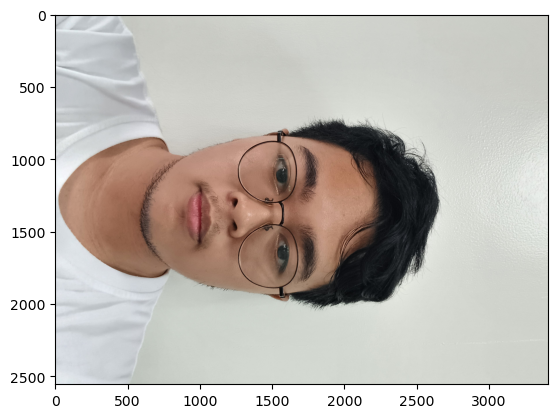

Prediction: ['Montaniel']


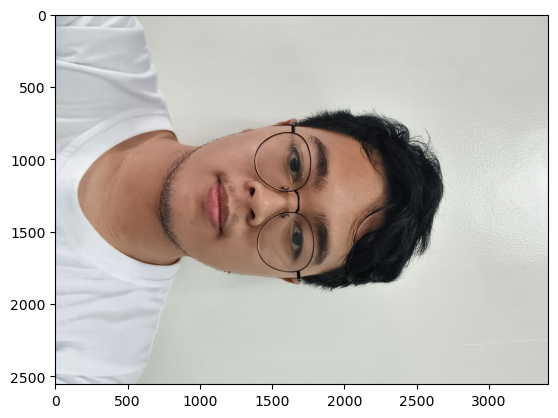

Prediction: ['Montaniel']


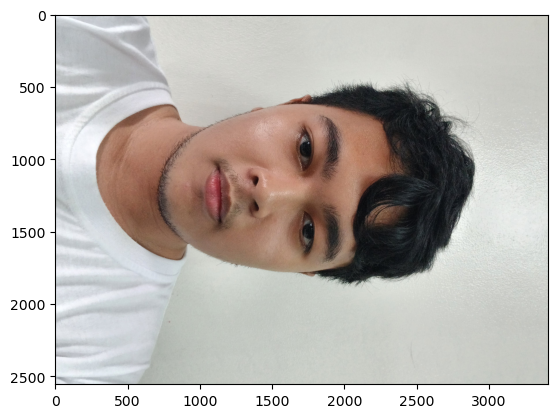

Prediction: ['Montaniel']


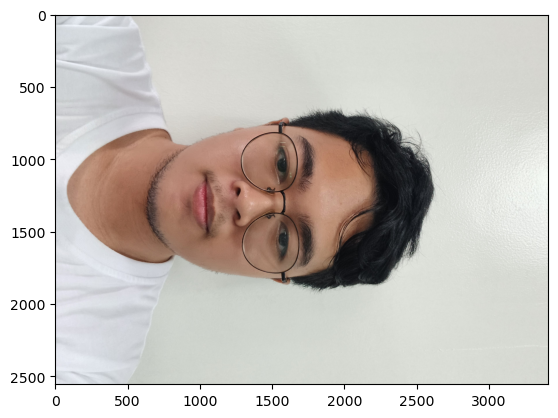

Prediction: ['Montaniel']


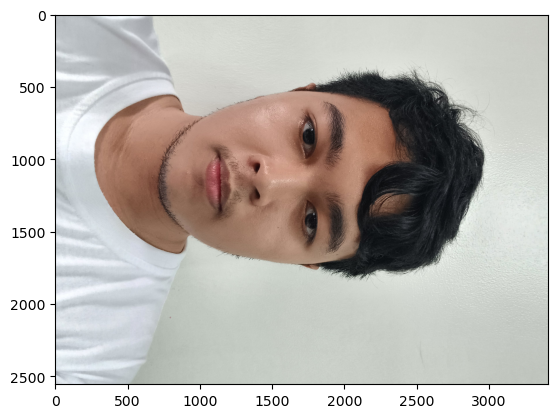

Prediction: ['Montaniel']


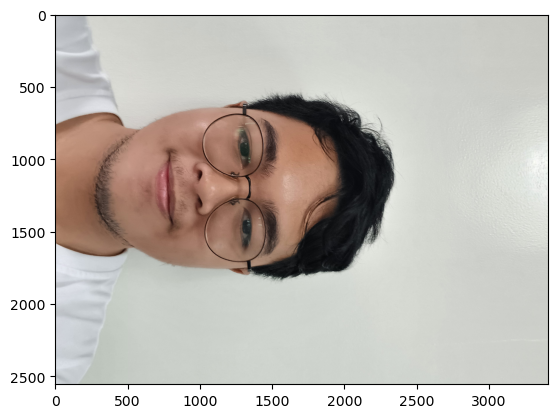

Prediction: ['Montaniel']


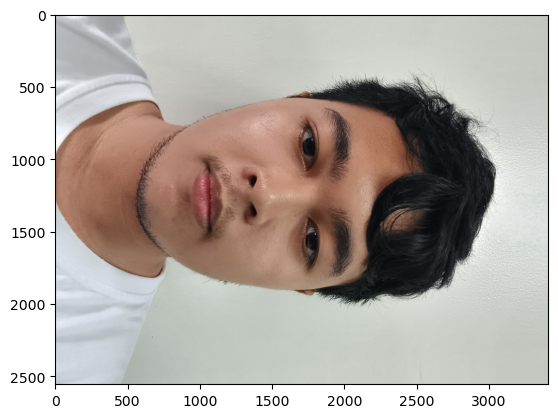

Prediction: ['Montaniel']


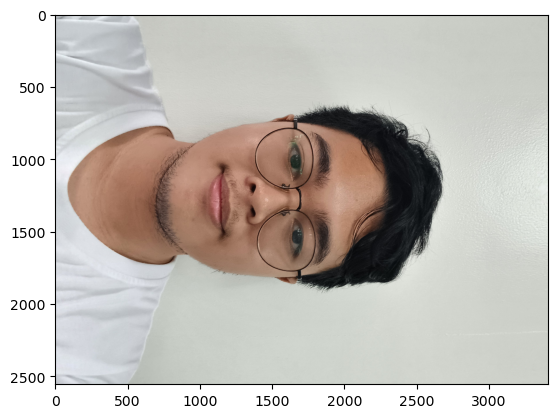

Prediction: ['Montaniel']


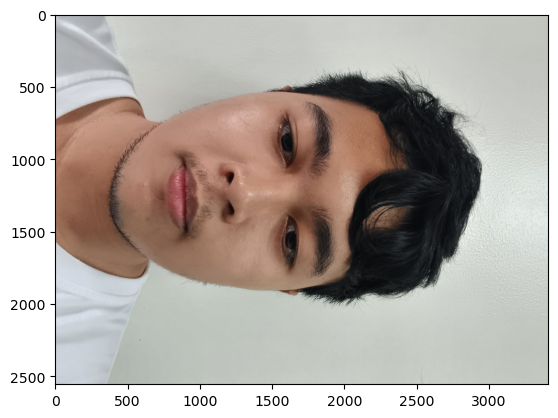

Prediction: ['Ordave']


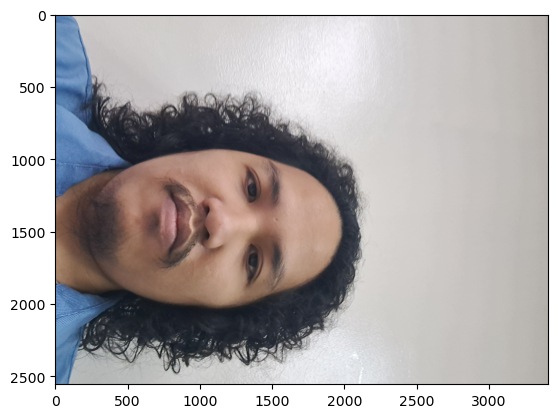

Prediction: ['Ordave']


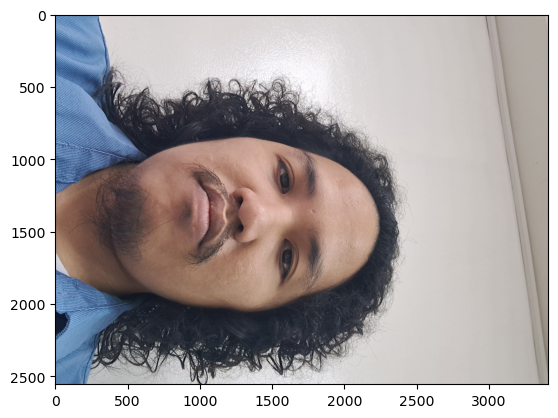

Prediction: ['Ordave']


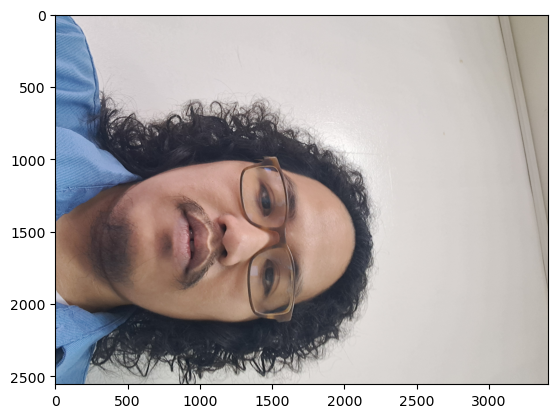

Prediction: ['Ordave']


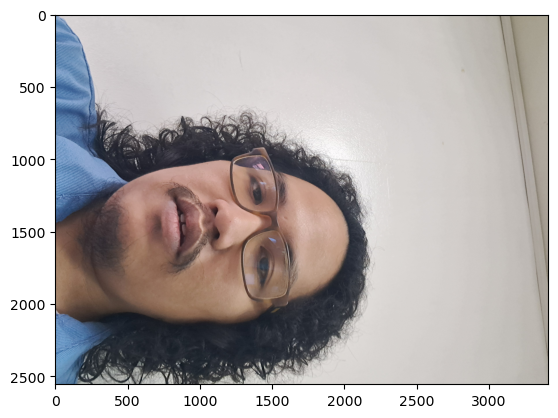

Prediction: ['Ordave']


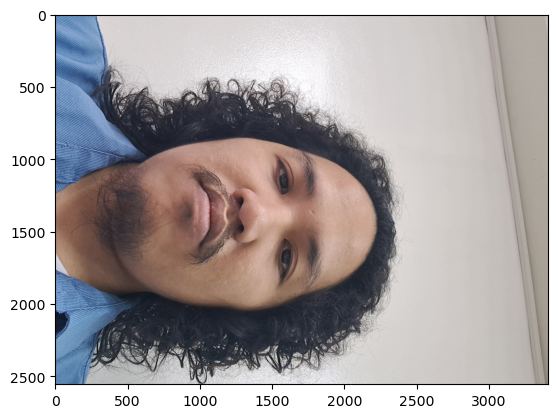

Prediction: ['Ordave']


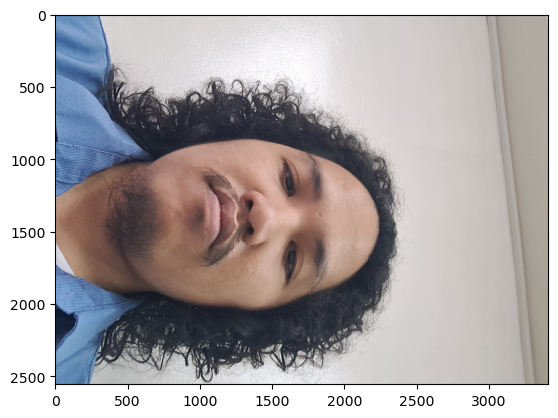

Prediction: ['Ordave']


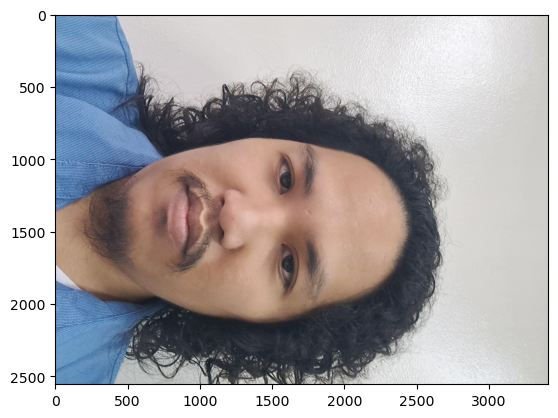

Prediction: ['Ordave']


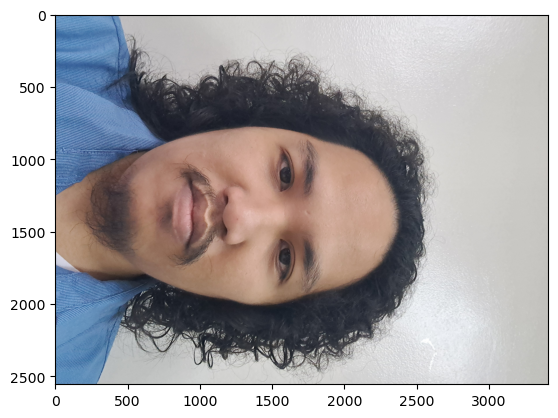

Prediction: ['Ordave']


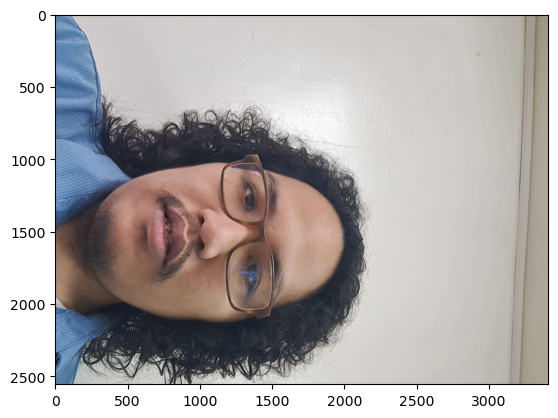

Prediction: ['Ordave']


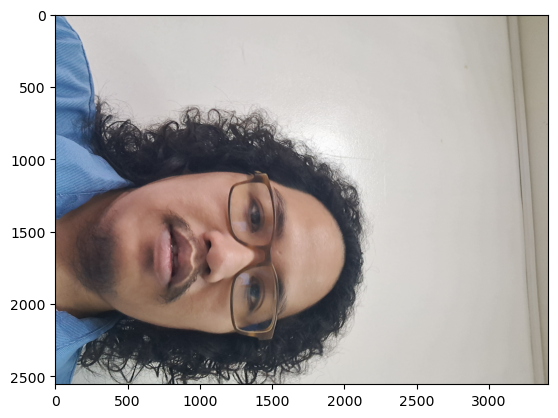

Prediction: ['Ordave']


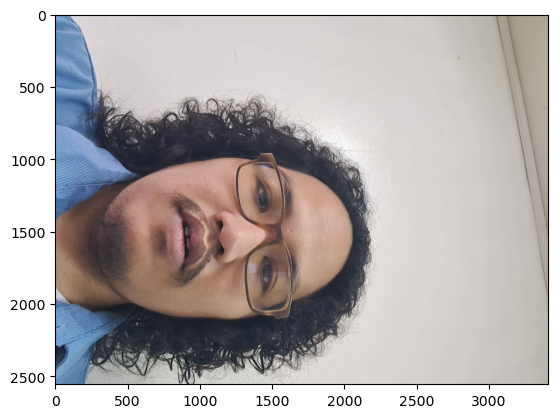

Prediction: ['Ordave']


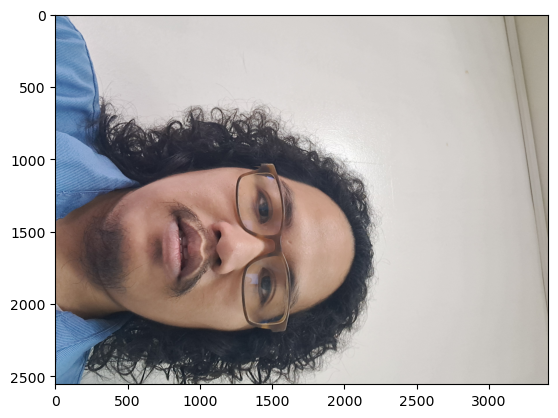

Prediction: ['Ordave']


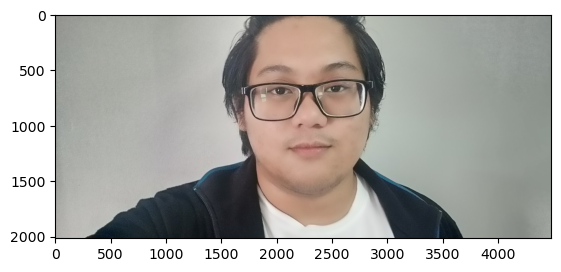

Prediction: ['Ordave']


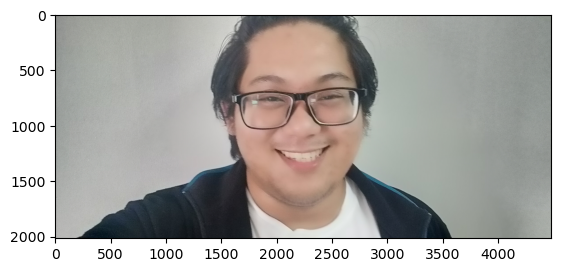

Prediction: ['Montaniel']


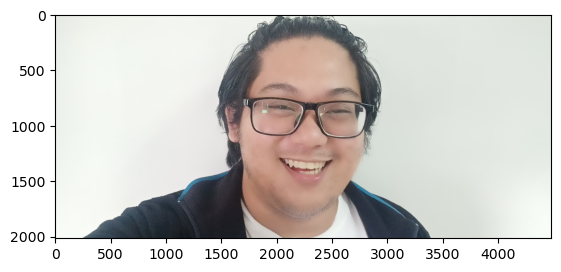

Prediction: ['Satch']


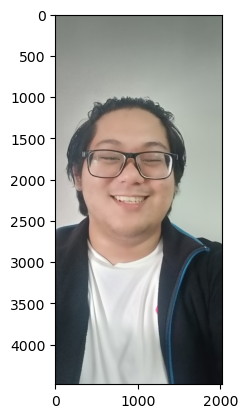

Prediction: ['Satch']


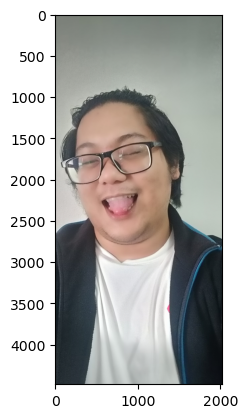

Prediction: ['Satch']


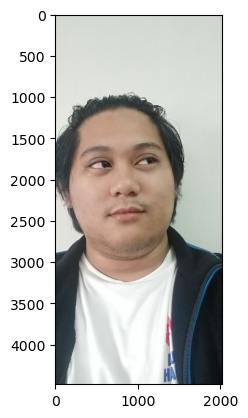

Prediction: ['Satch']


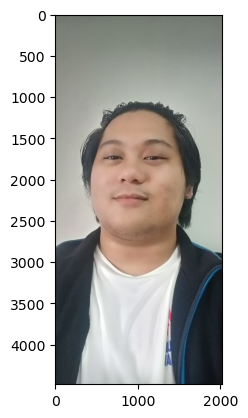

Prediction: ['Satch']


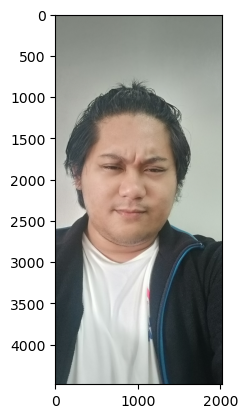

Prediction: ['Satch']


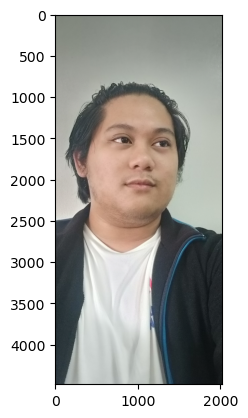

Prediction: ['Satch']


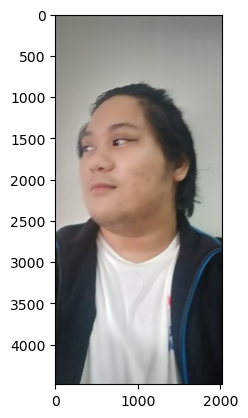

Prediction: ['Montaniel']


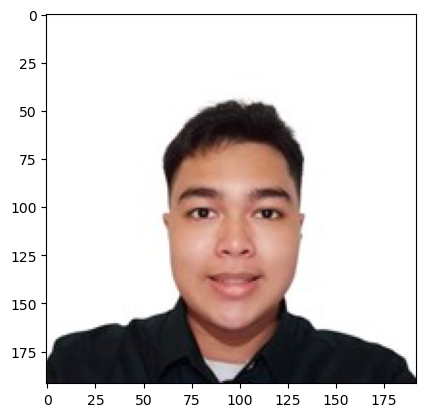

Prediction: ['Ordave']


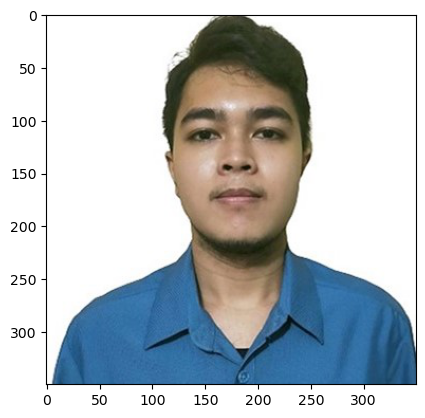

Prediction: ['Montaniel']


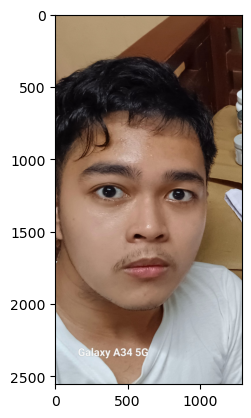

Prediction: ['Satch']


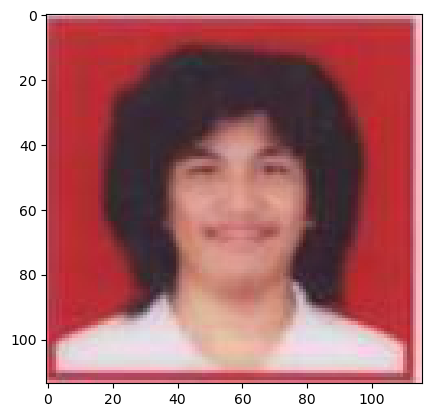

Prediction: ['Ordave']


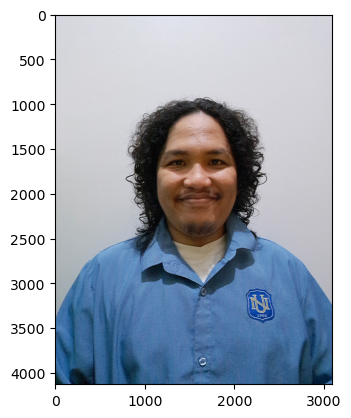

Prediction: ['Ordave']


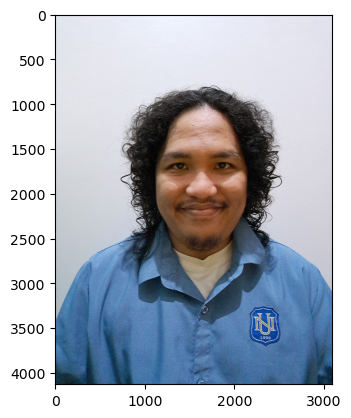

Prediction: ['Ordave']


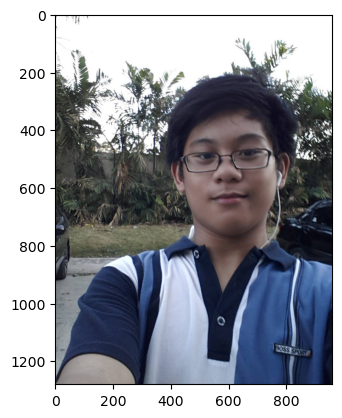

Prediction: ['Ordave']


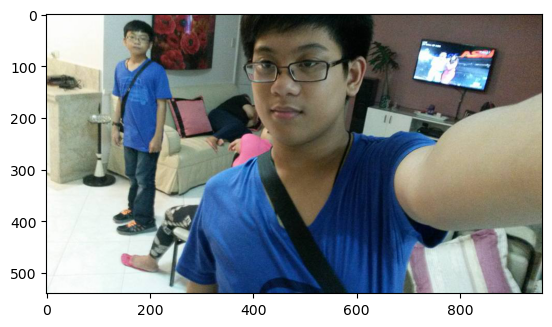

Prediction: ['Satch']


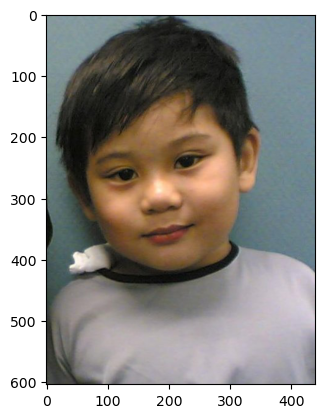

Prediction: ['Satch']


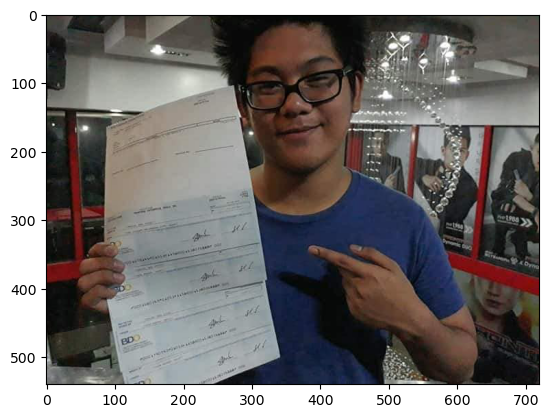

In [29]:
for path in [testFilesPath, newTestFilesPath]:
	for root, dir, files in os.walk(path):
		for file in files:
			target = os.path.join(root, file)
			prediction = predictImg(target, model)
			print(f"Prediction: {prediction}")
			displayImage(target)